# Extract HI emission spectra from GASS
- extract spectra from GASS
- compare emission and Absorption spectra

In [2]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from astropy import units as u
from astropy.coordinates import SkyCoord, EarthLocation
from astropy.io import fits
from spectral_cube import SpectralCube
from spectral_cube import BooleanArrayMask
from astropy.convolution import Gaussian1DKernel, convolve
import aplpy  
from astropy.wcs import WCS
from reproject import reproject_interp
from astroquery.vizier import Vizier
from astroquery.skyview import SkyView
from astropy.time import Time
import csv
from astropy.io import ascii
import pandas as pd
#from spectres import spectres 

Vizier.ROW_LIMIT = -1

mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.size'] = '16'
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
%matplotlib inline

In [16]:
field = 'Hydra'
#field = 'Norma'
sources = pd.read_csv('./5_sigma_askap_sources_{}.csv'.format(field))

gass = fits.open('/Users/denes/Research/high_lat_HI/GAS_data/gass_158_-28_Hydra_v2.fits')  # Hydra
#gass = fits.open('/Users/denes/Research/high_lat_HI/GAS_data/gass_250_-60_Norma_4k.fits')  # Norma

d_gass = gass[0].data
h_gass = gass[0].header
h_gass['CUNIT3'] = 'm/s'
w_gass = WCS(h_gass, gass)

print('Number of sources: ', len(sources))

Number of sources:  56


In [17]:
sources.keys()

Index(['Unnamed: 0', 'id', 'catalogue_id', 'other_sbids', 'first_sbid',
       'project_id', 'island_id', 'island_name', 'n_components', 'ra_hms_cont',
       'dec_dms_cont', 'ra_deg_cont', 'dec_deg_cont', 'freq', 'maj_axis',
       'min_axis', 'pos_ang', 'flux_int', 'flux_int_err', 'flux_peak',
       'mean_background', 'background_noise', 'max_residual', 'min_residual',
       'mean_residual', 'rms_residual', 'stddev_residual', 'x_min', 'x_max',
       'y_min', 'y_max', 'n_pix', 'solid_angle', 'beam_area', 'x_ave', 'y_ave',
       'x_cen', 'y_cen', 'x_peak', 'y_peak', 'flag_i1', 'flag_i2', 'flag_i3',
       'flag_i4', 'comment', 'quality_level', 'released_date', 'rms_abs',
       'tau_max', 'min_askap'],
      dtype='object')

In [18]:
ra = np.array(sources['ra_hms_cont'])
dec = np.array(sources['dec_dms_cont'])

h_gass['*3']

NAXIS3  =                  253 / length of data axis 3                          
CTYPE3  = 'VELO-LSRK'          / axis type                                      
CRVAL3  =  -4.944240112305E+05 / velocity                                       
CRPIX3  =                    1 / ref pixel                                      
CDELT3  =   3.924000024796E+03 / velocity increment                             
CROTA3  =   0.000000000000E+00 / velocity rotation                              
CUNIT3  = 'm/s     '           / unit type                                      

<ipython-input-19-3f96d4ad4798>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(16, 12))


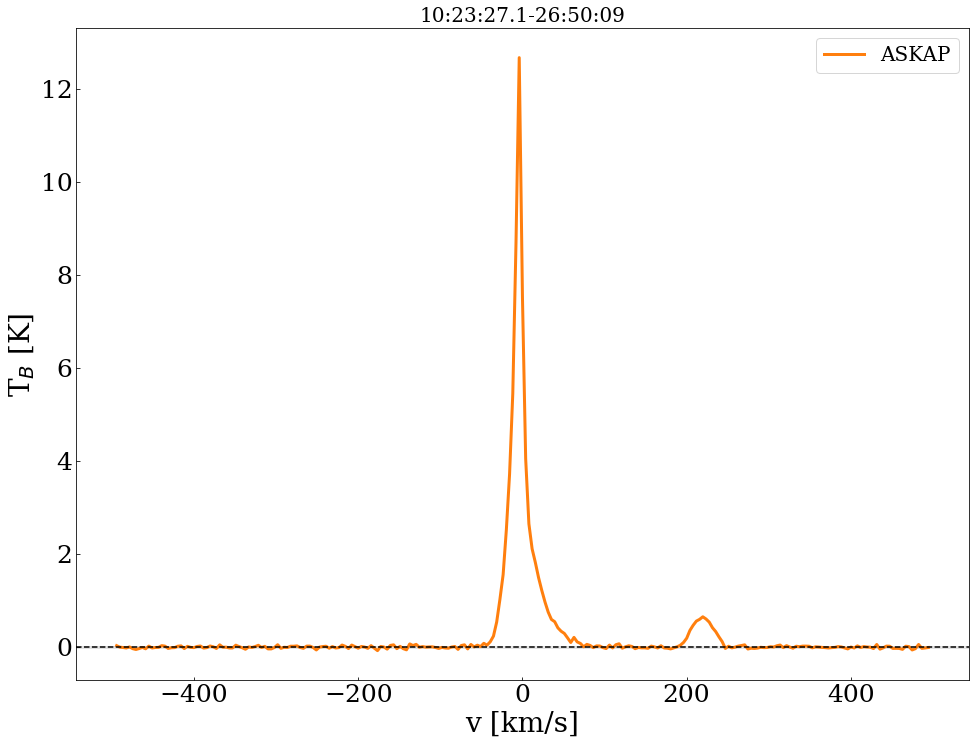

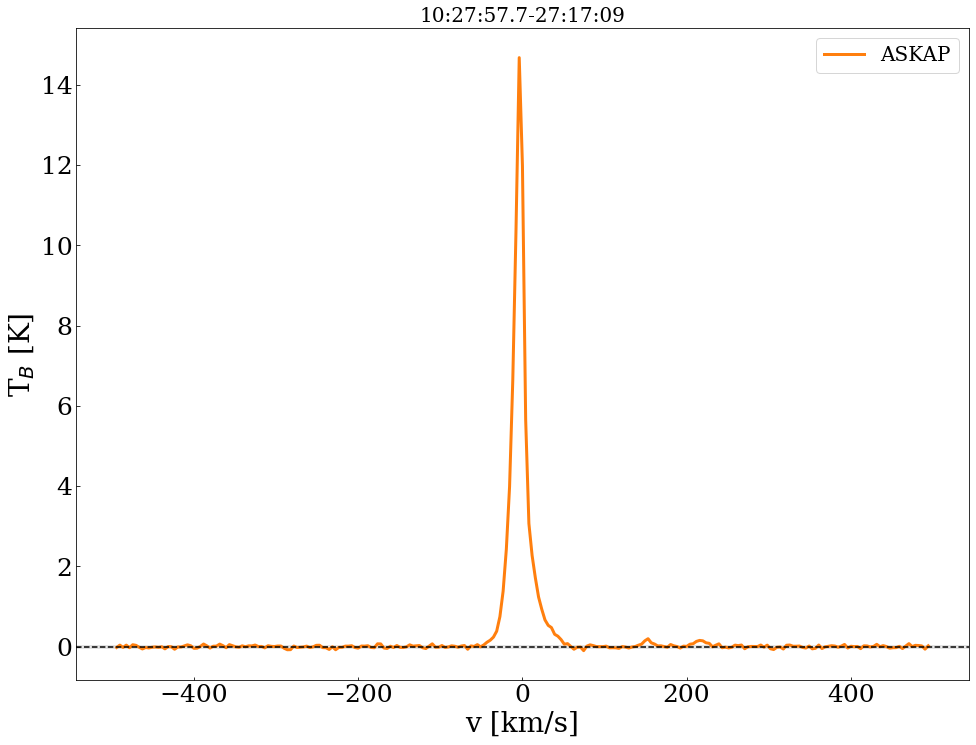

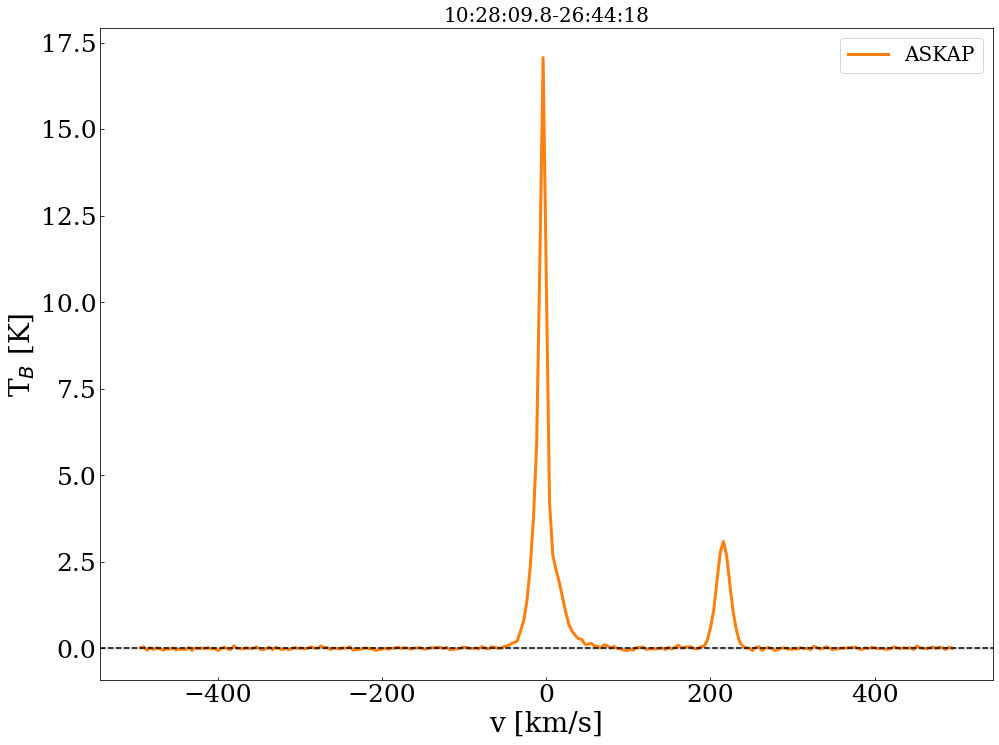

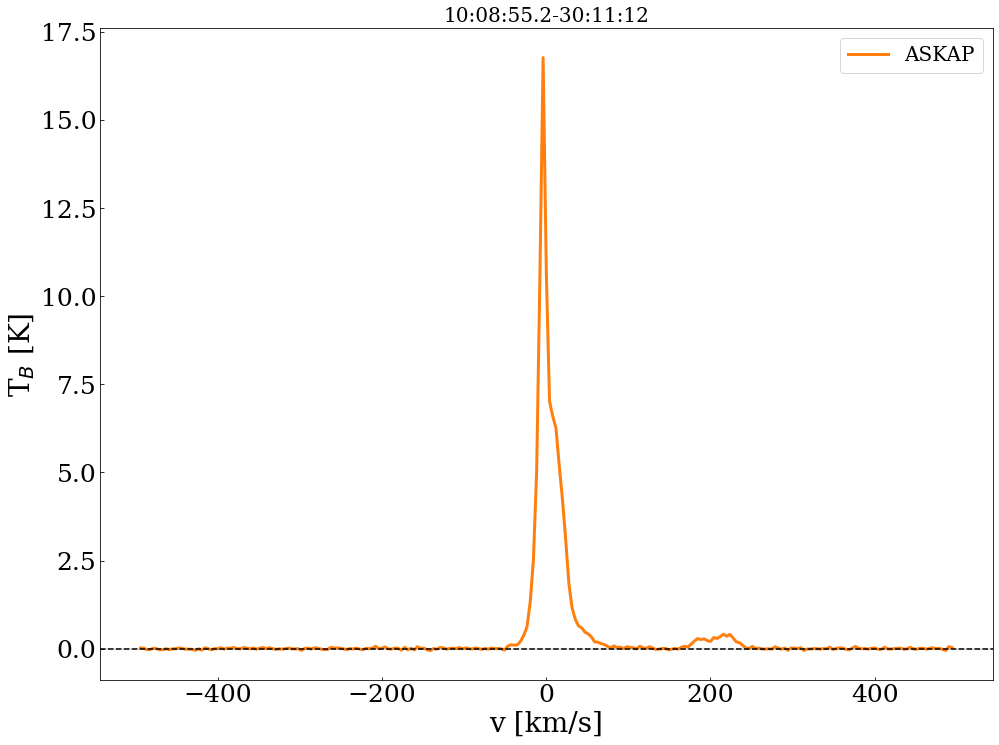

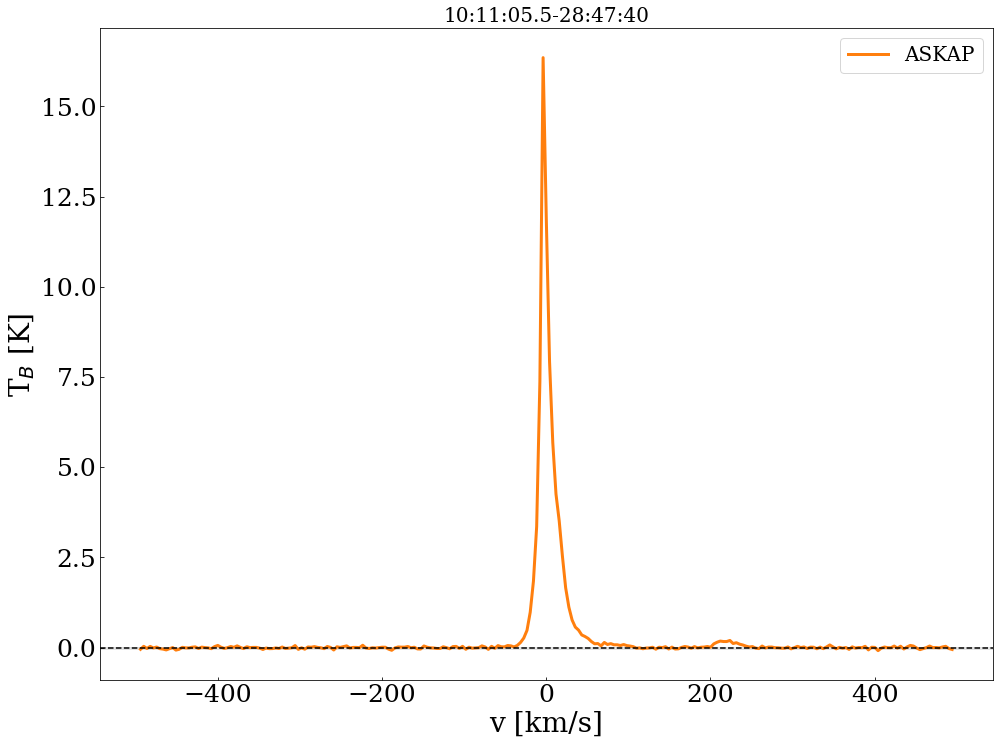

...

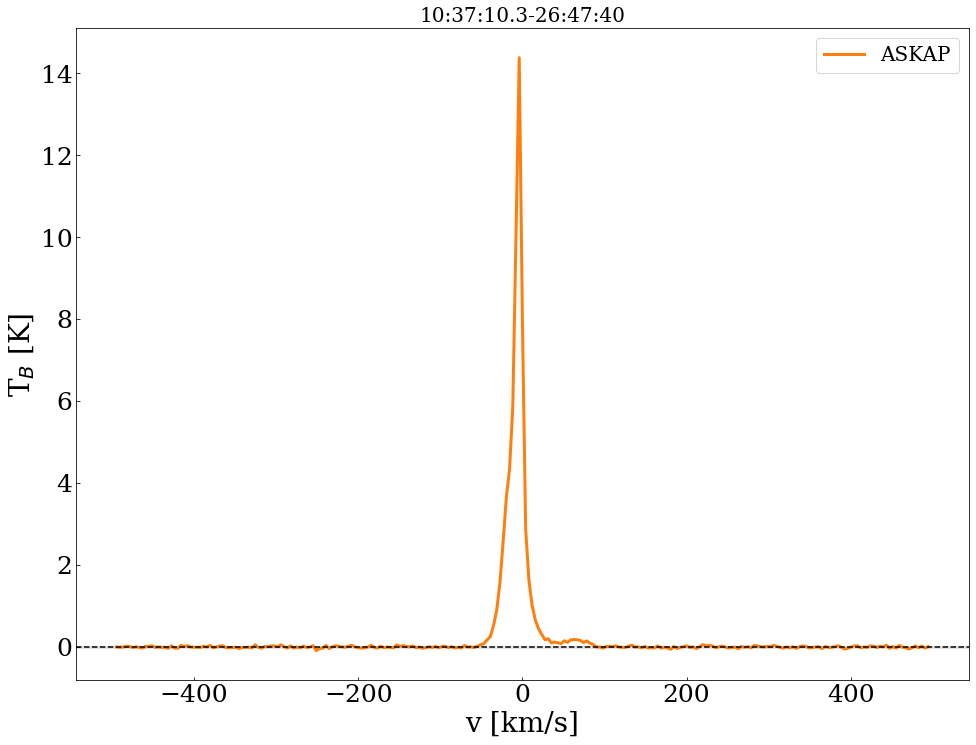

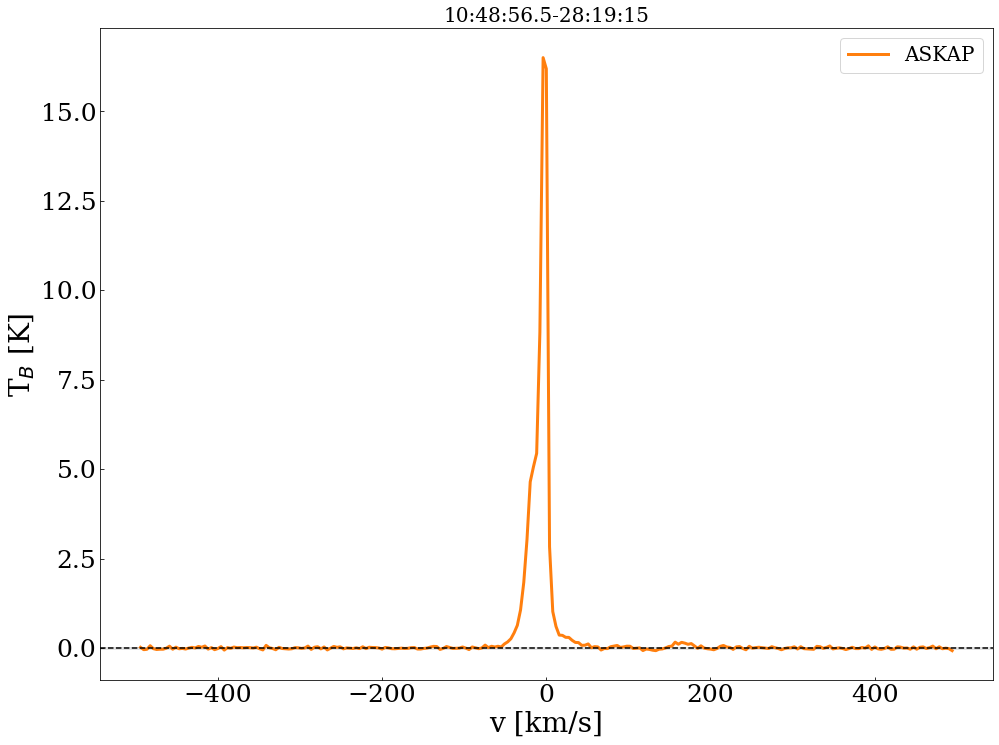

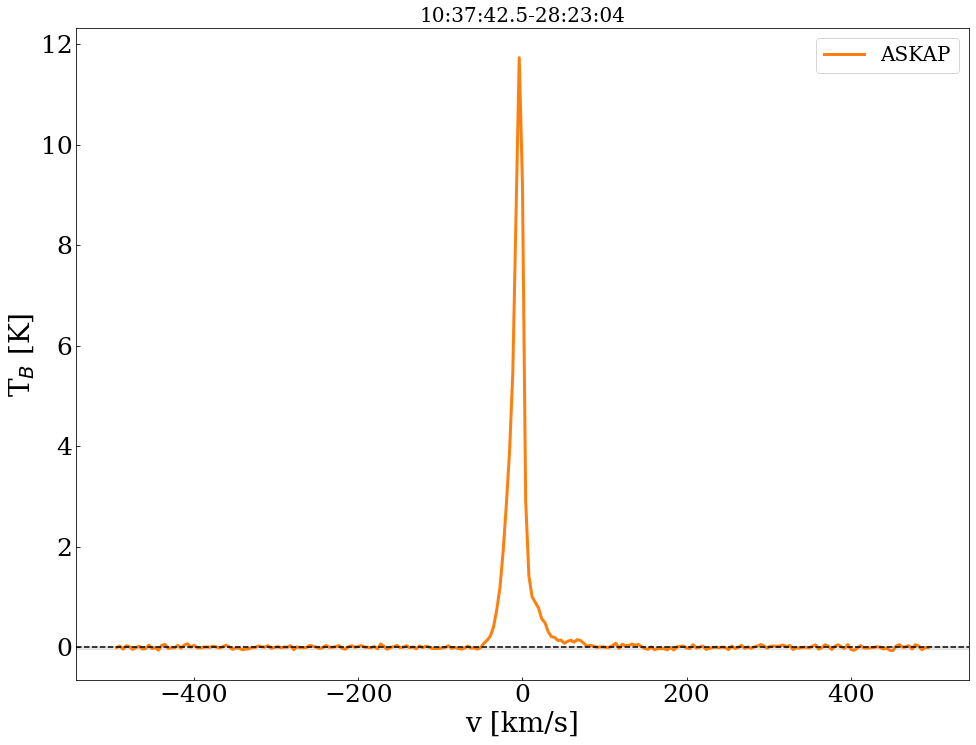

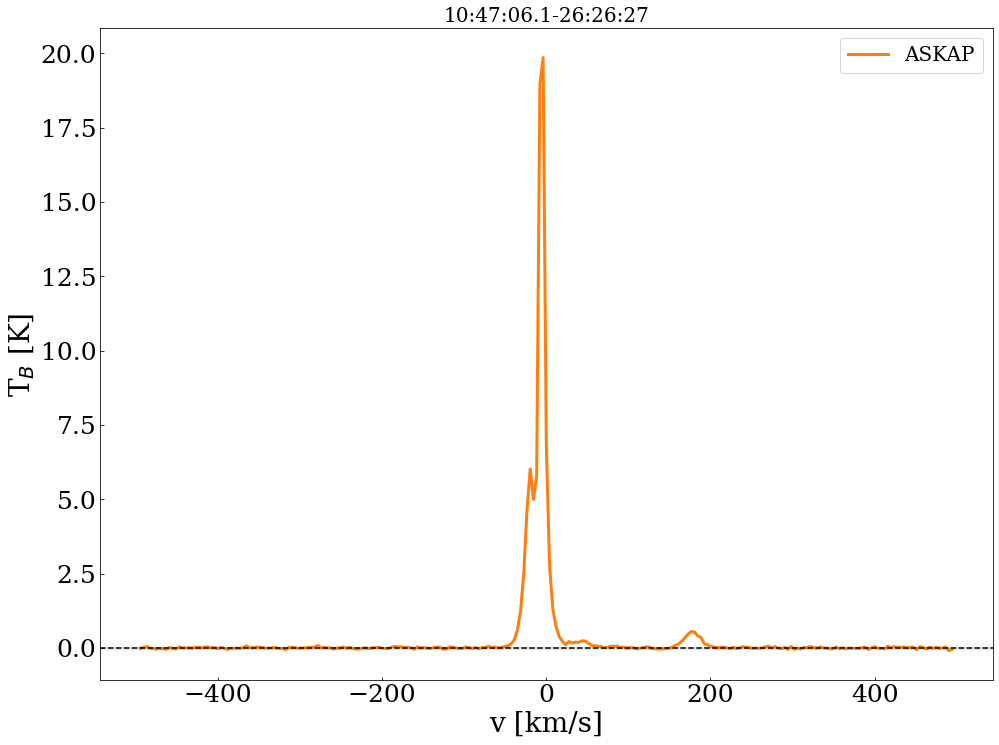

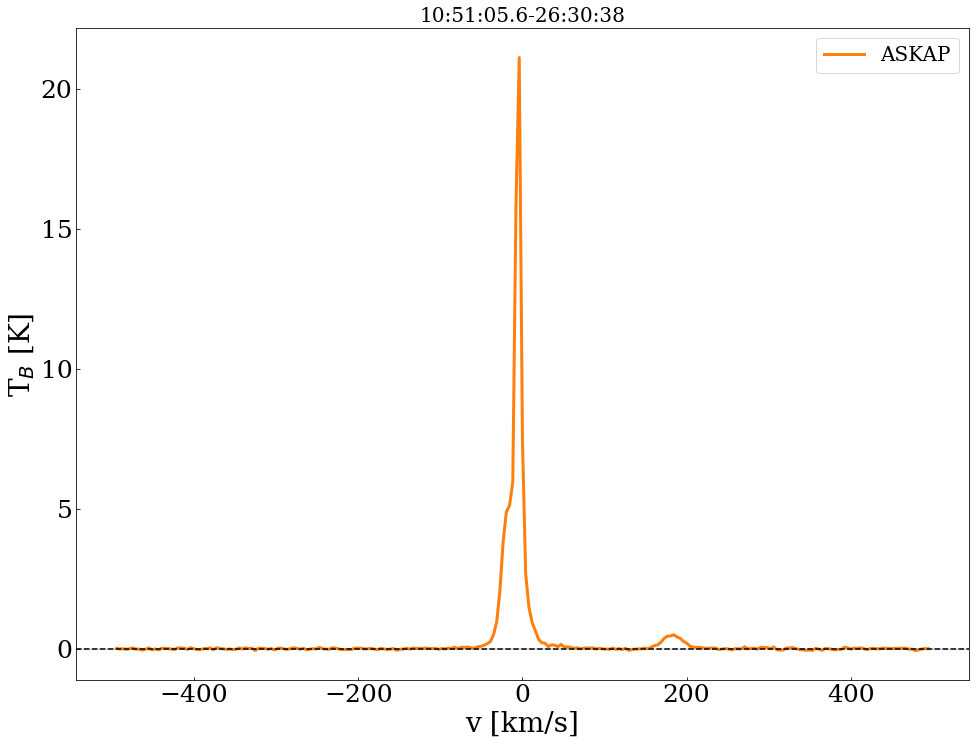

In [19]:
# extract GASS spectra
# make plots
# write spectra into files

detection = []
rms_abs = []
tau_max = []

for i in range(len(sources)):
    coord = '{} {}'.format(ra[i], dec[i])
    c2 = SkyCoord(coord, unit=(u.hourangle, u.deg))
    pixels_gass = c2.to_pixel(w_gass)
    #print(pixels_gass)
    #print(pixels_askap)

    spectrum_gass = d_gass[:, int(pixels_gass[1]), int(pixels_gass[0])]  # 10:09:10 -28:55:57
    rms = np.sqrt(np.mean(spectrum_gass[0:100]**2))
    rms_abs.append(rms)


    # plot
    fig = plt.figure(figsize=(16, 12))
    ax = fig.add_subplot(111)
    ax.set_title('{}{}'.format(ra[i], dec[i]), fontsize=20)
    chan = np.arange(len(spectrum_gass))*h_gass['CDELT3'] + h_gass['CRVAL3']

    plt.plot(chan/1000, spectrum_gass, 'C1', linewidth=3, label='ASKAP')
    ax.axhspan(0-rms, 0+rms, alpha=0.5, color='lightgrey')
    #plt.title('102809-264418', fontsize=30)
    plt.ylabel(r'T$_{B}$ [K]', fontsize=28)
    plt.xlabel("v [km/s]", fontsize=28)
    #plt.xlim(-300,600)
    #plt.ylim(0.92,1.02)
    plt.axhline(0, color='k', linestyle='--')
    plt.legend(fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=25)
    fig.savefig('./spectra_plots/{}/{}{}_gass_spectra.png'.format(field, ra[i].replace(':',''), dec[i].replace(':','')))

    df_spectra = pd.DataFrame()
    df_spectra['velocity'] = chan / 1000
    df_spectra['Tb'] = spectrum_gass
    df_spectra.to_csv('./spectra/{}/{}{}_gass_spectrum.txt'.format(field, ra[i].replace(':',''), dec[i].replace(':','')), sep='\t')


# Plot HI emission and absorption in one plot

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


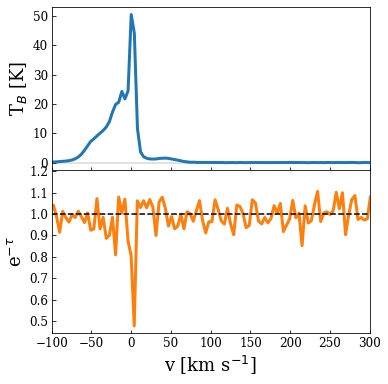

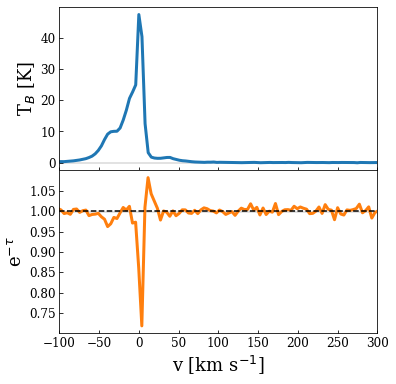

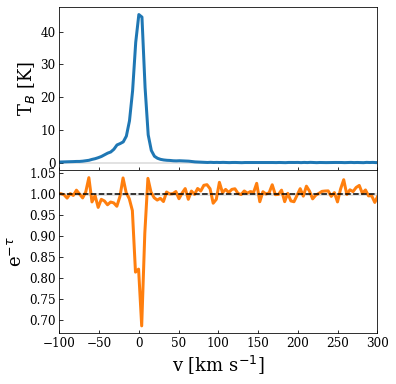

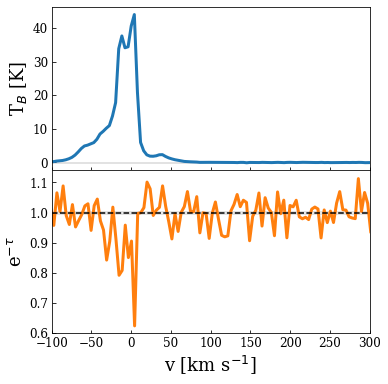

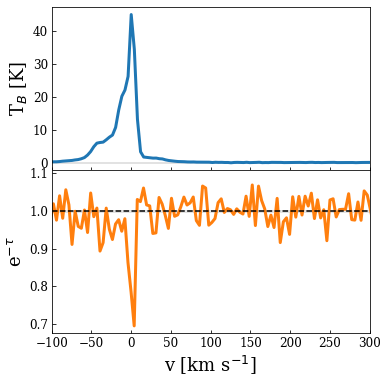

...

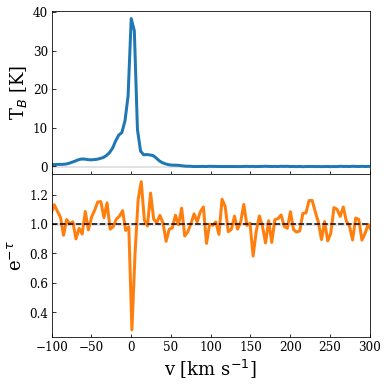

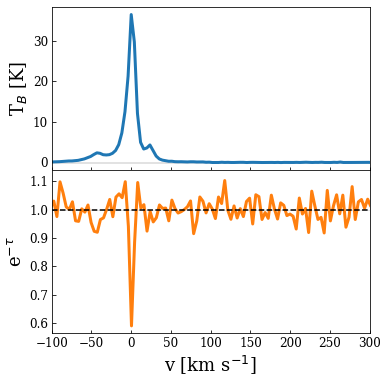

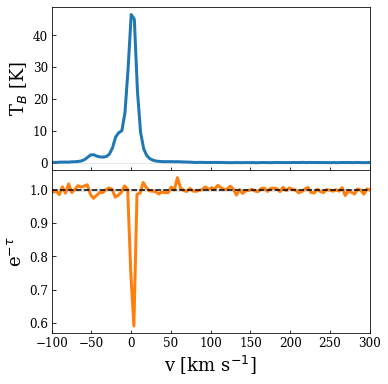

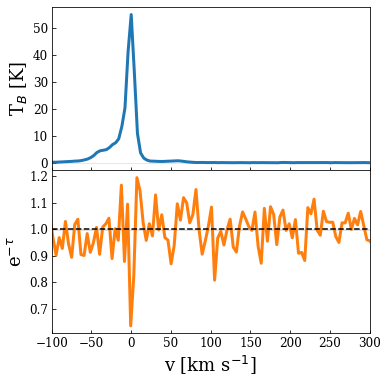

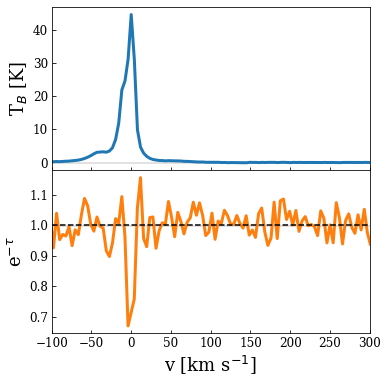

In [6]:
# extract GASS spectra
# make plots
# write spectra into files

detection = []
rms_abs = []
tau_max = []

for i in range(len(sources)):
    coord = '{} {}'.format(ra[i], dec[i])
    c2 = SkyCoord(coord, unit=(u.hourangle, u.deg))
    pixels_gass = c2.to_pixel(w_gass)
    #print(coord )
    #print(pixels_askap)

    spectrum_gass = d_gass[:, int(pixels_gass[1]), int(pixels_gass[0])]  # 10:09:10 -28:55:57
    rms = np.sqrt(np.mean(spectrum_gass[0:100]**2))
    rms_abs.append(rms)
    chan = np.arange(len(spectrum_gass))*h_gass['CDELT3'] + h_gass['CRVAL3']
    gass_vel = np.array(chan/1000)
    
    # read ASKAP spectra
    data_askap = pd.read_csv('./spectra/{}/{}{}_askap_spectrum.txt'.format(field, ra[i].replace(':',''), dec[i].replace(':','')), sep='\t')
    askap_spectra = data_askap['Amplitude']
    askap_vel = data_askap['velocity']
    rms_askap = np.sqrt(np.mean(askap_spectra**2))
    err = np.zeros(len(spectrum_gass)) * rms
    #spectrum_gass_new, err_new = spectres(np.array(askap_vel), np.array(gass_vel), np.array(spectrum_gass), err, fill=0.)

    plt.figure(figsize=(5.7,6))
    plt.clf()
    ax = plt.subplot2grid((6, 4), (0, 0), colspan=4, rowspan=3)
    plt.subplots_adjust(hspace=0.001)
    ax.axhspan(0-rms, 0+rms, alpha=0.5, color='lightgrey')
    plt.plot(chan/1000, spectrum_gass, 'C0', linewidth=3, label='GASS')
    #plt.plot(askap_vel, spectrum_gass_new, 'C1', linewidth=3, label='GASS')
    
    plt.xticks(visible=False)
    plt.ylabel("T$_{B}$ [K]", size=18)
    #plt.title('J'+str(sources[i][1:]), size=20 )
    plt.xlim([-100,300])
    plt.yticks(size=12)

    #P.subplot(312)
    ax = plt.subplot2grid((6, 4), (3, 0), colspan=4, rowspan=3)
    #plt.xticks(visible=False)
    ax.axhspan(2-rms_askap, rms_askap, alpha=0.5, color='lightgrey')
    plt.plot(askap_vel, askap_spectra, 'C1', linewidth=3, label='ASKAP')
    plt.axhline(1, color='k', linestyle='--')
    plt.xlabel("v [km s$^{-1}$]", size=18)
    plt.ylabel(r'e$^{-\tau}$', size=18)
    plt.xlim([-100,300])
    #P.ylim([-0.2,1.1])
    #P.xticks(size=8)
    plt.xticks(size=12)
    plt.yticks(size=12)

    plt.savefig('./spectra_plots/{}/{}{}_gass_askap_spectra.png'.format(field, ra[i].replace(':',''), dec[i].replace(':','')), bbox_inches='tight', dpi=200)
    
    #df_spectra = pd.DataFrame()
    #df_spectra['velocity'] = chan / 1000
    #df_spectra['Tb'] = spectrum_gass
    #df_spectra.to_csv('./spectra/{}{}_gass_spectrum.txt'.format(ra[i].replace(':',''), dec[i].replace(':','')), sep='\t')


# Plot N(HI) and calculate H(HI) correction

<ipython-input-20-55a91948179b>:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(16, 12))


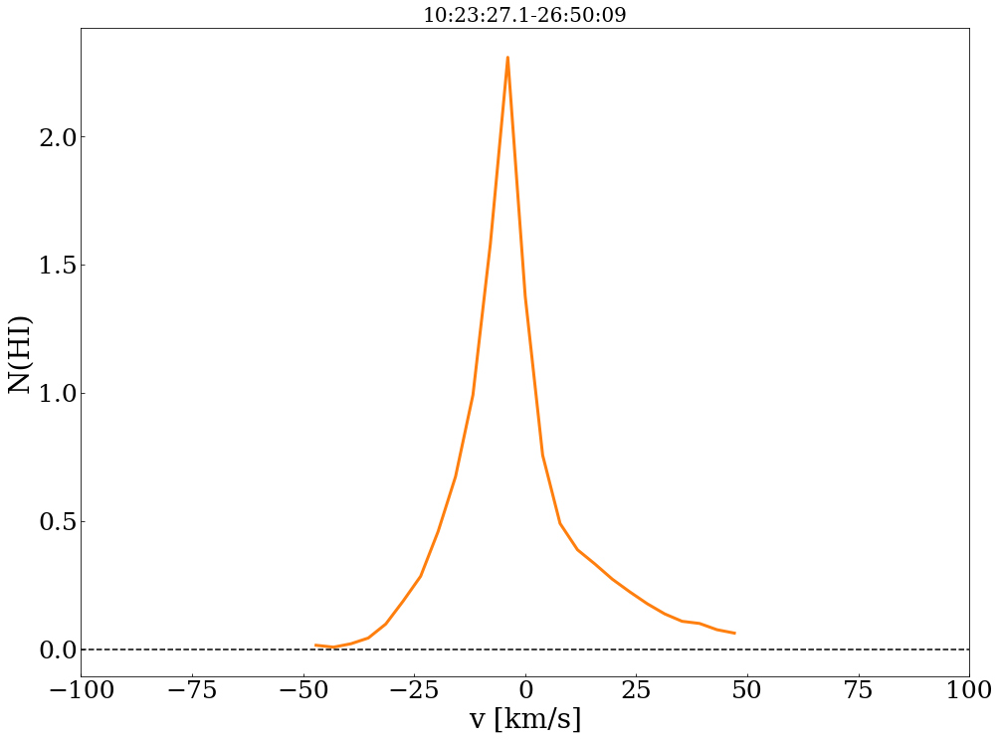

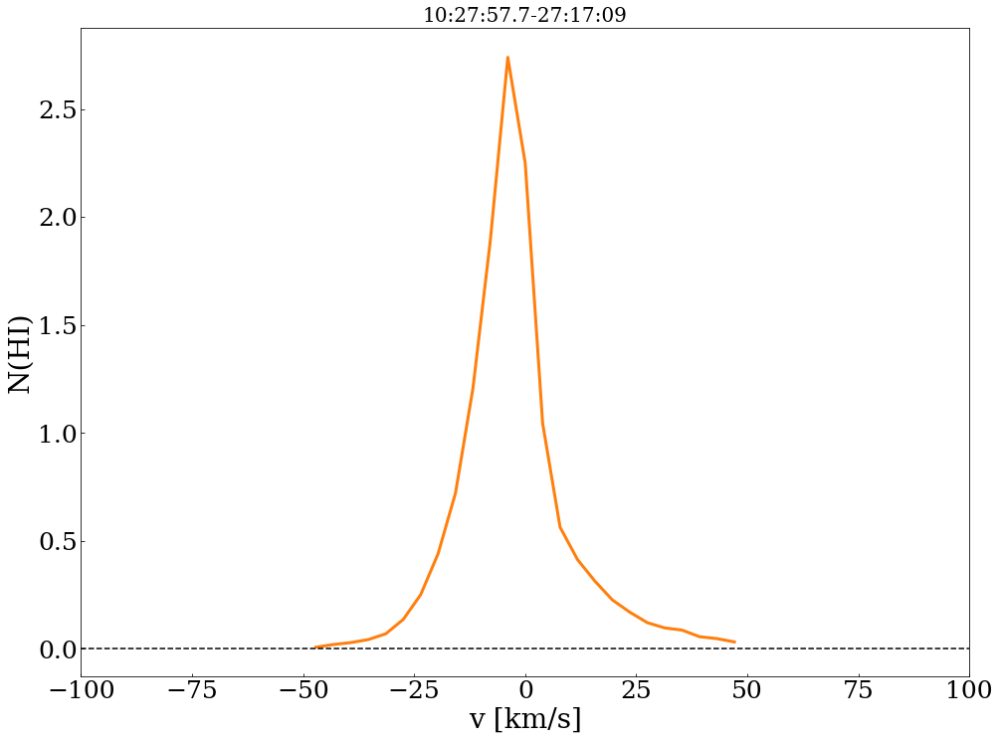

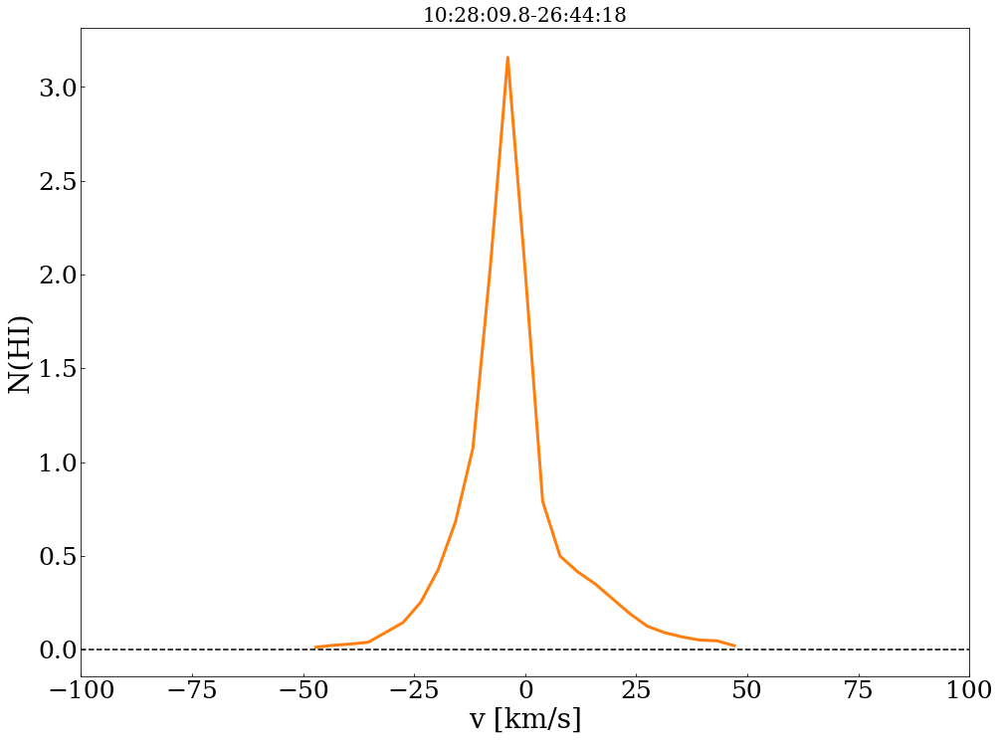

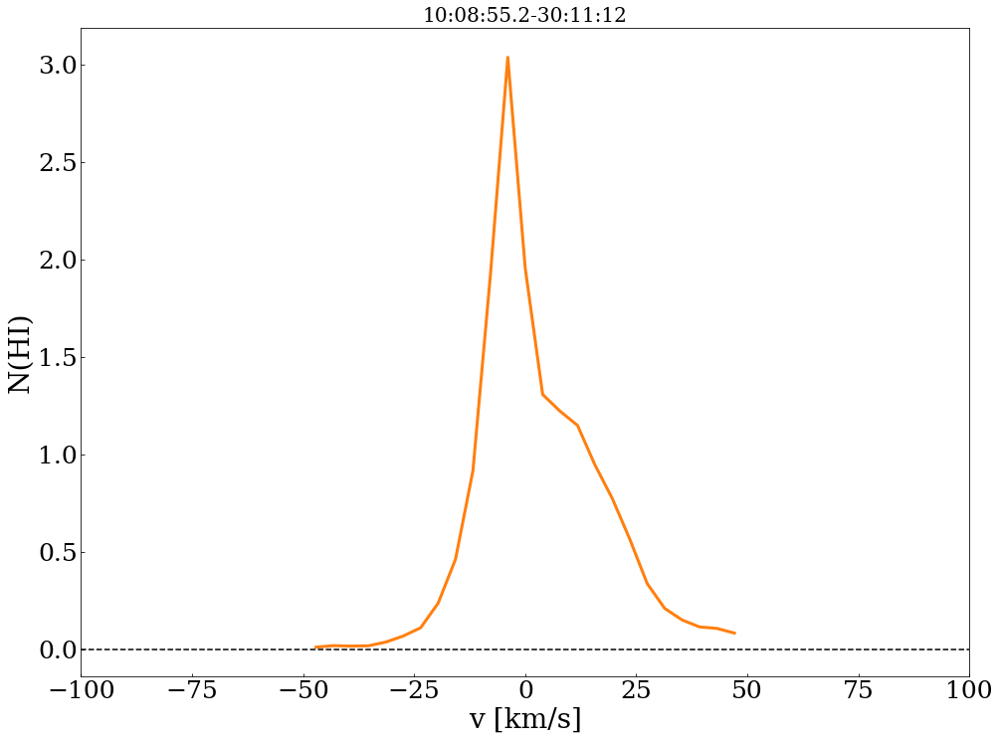

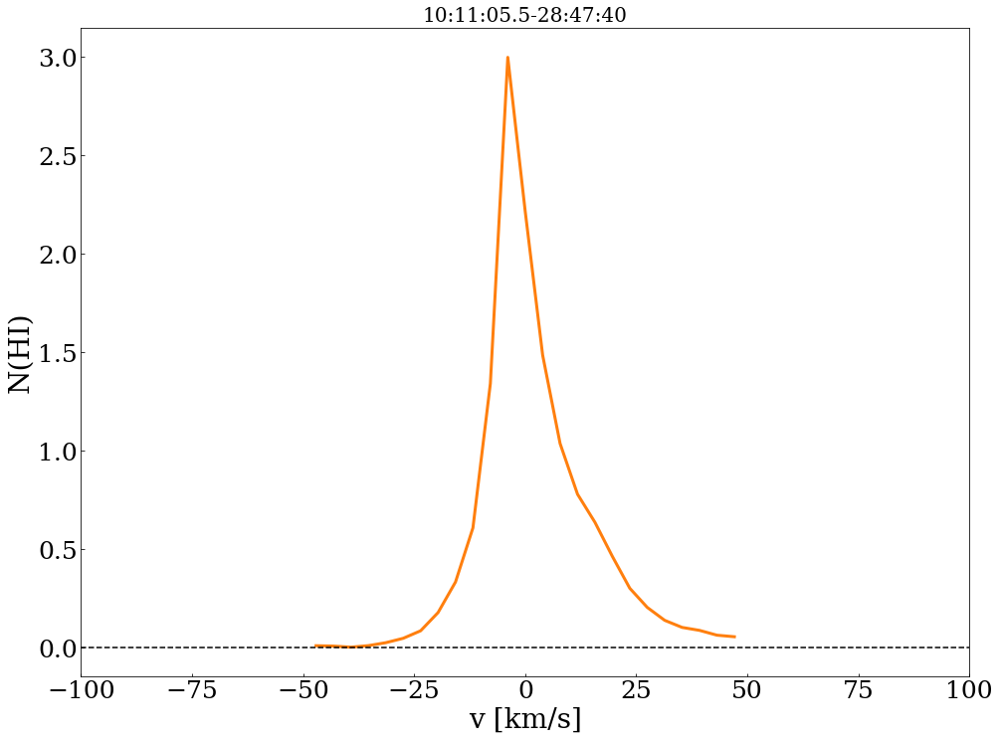

...

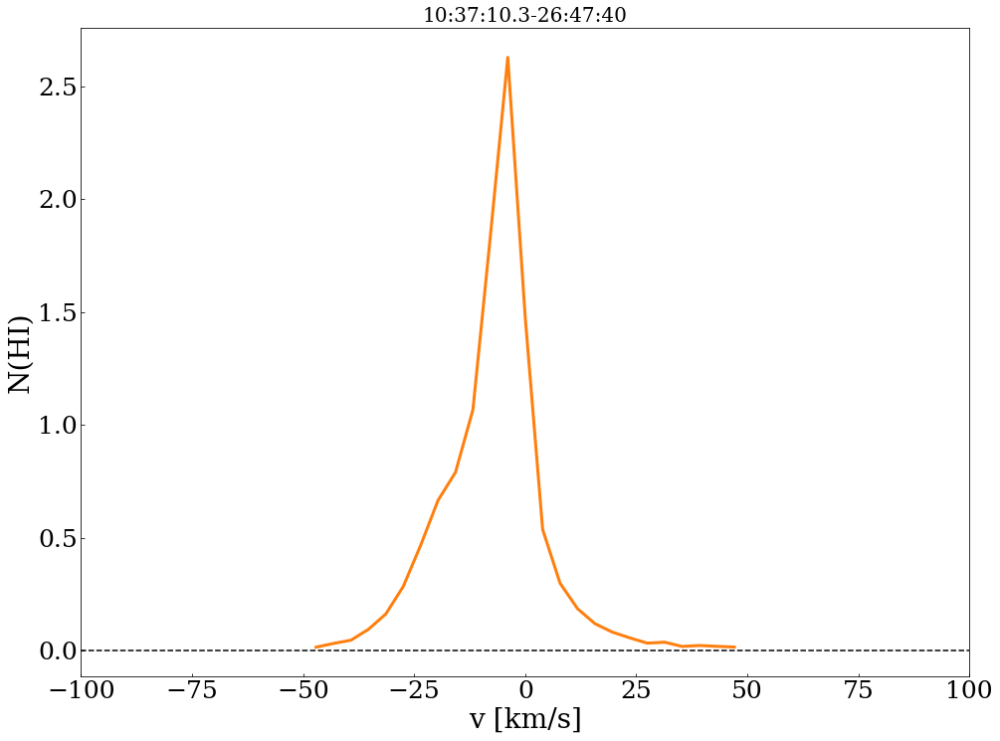

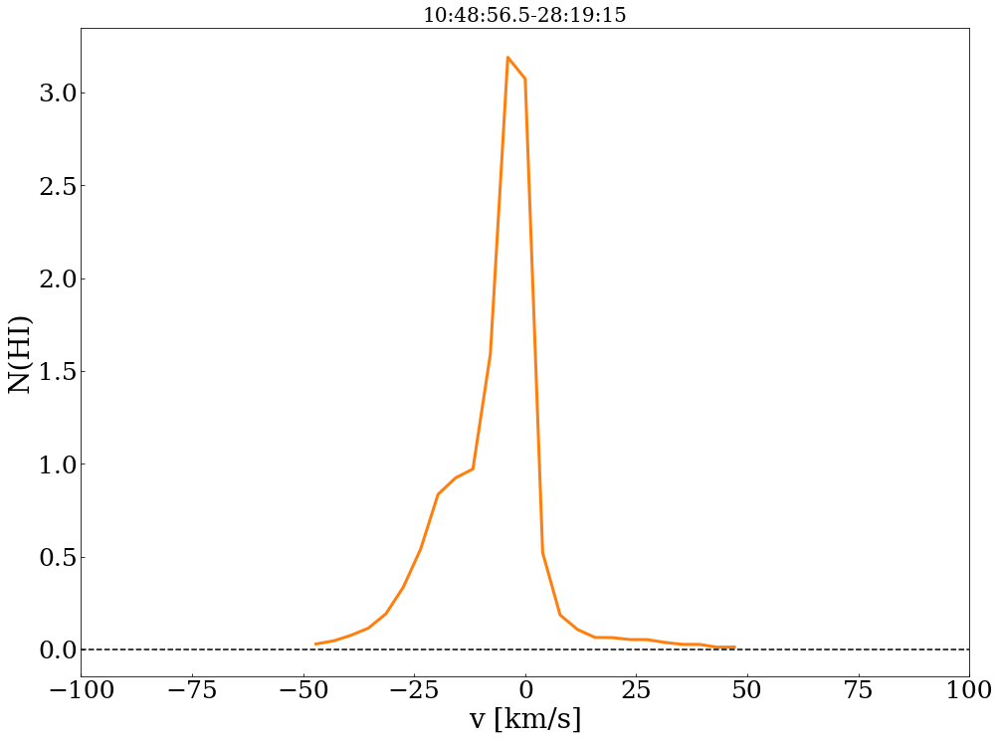

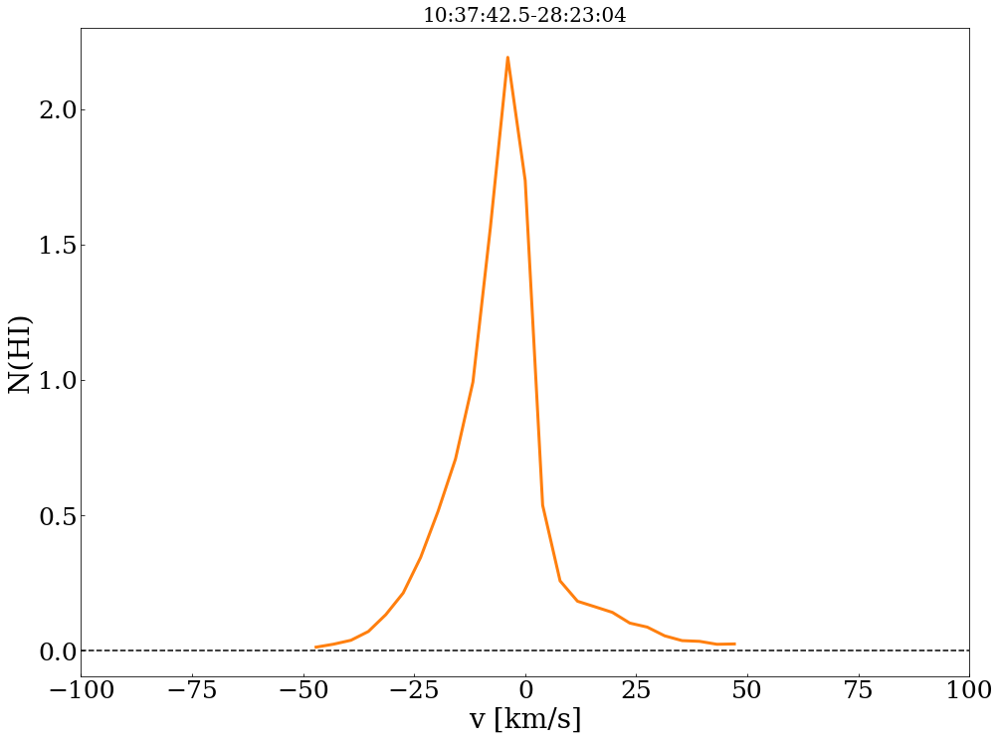

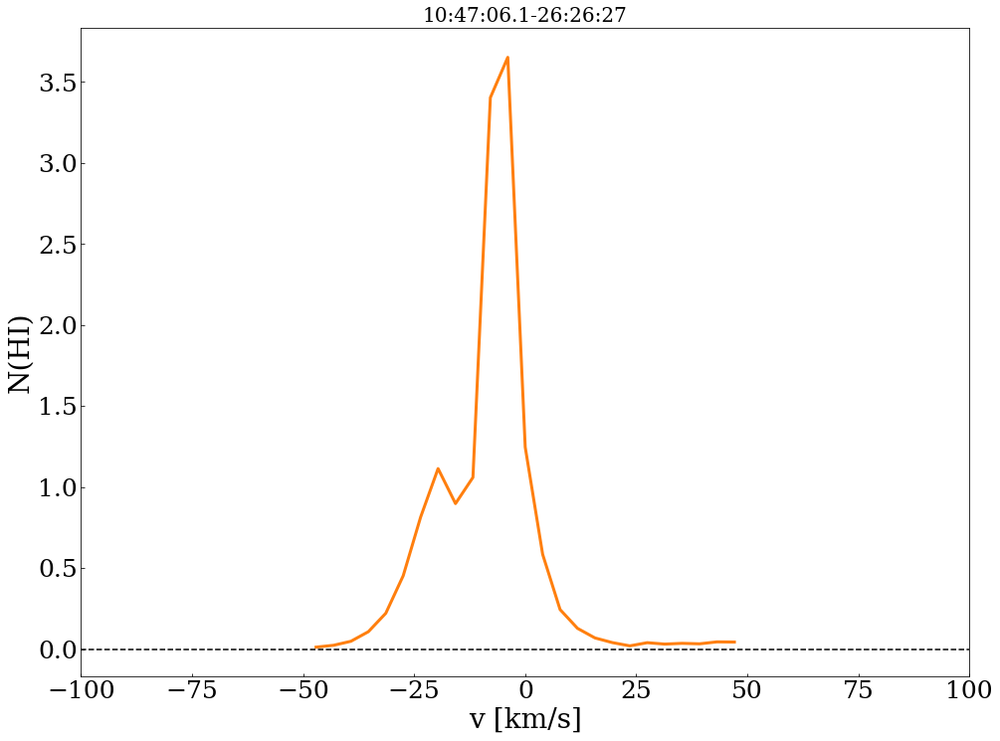

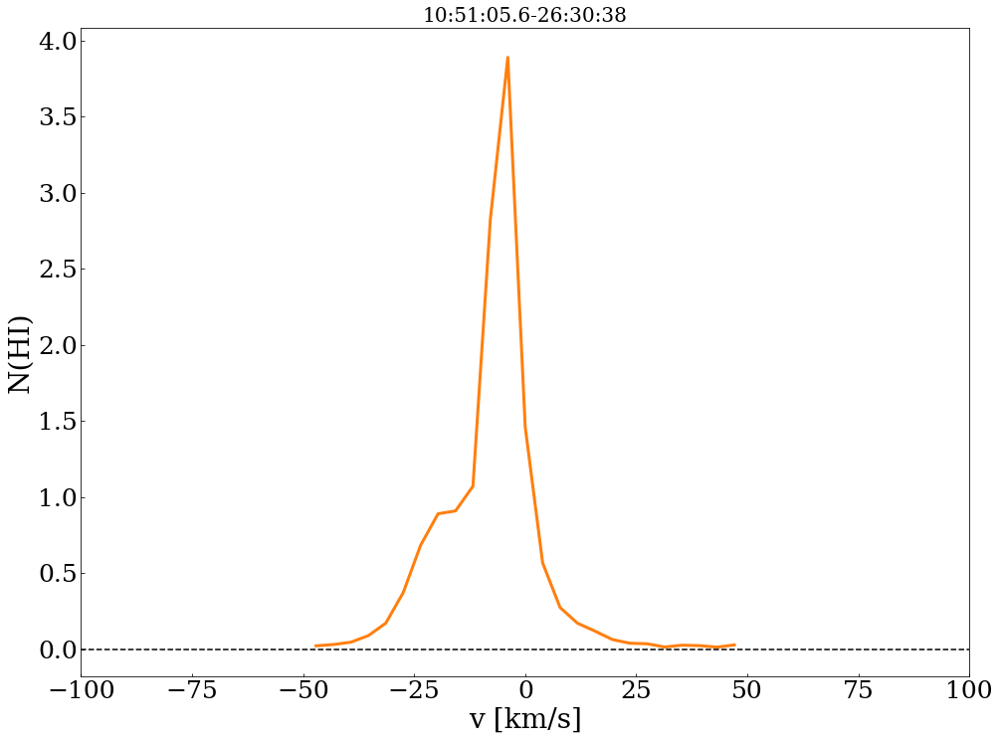

In [20]:
nhi_int = []
nhi_corr_int = []

for i in range(len(sources)):
    data_askap = pd.read_csv('./spectra/{}/{}{}_askap_spectrum.txt'.format(field, ra[i].replace(':',''), dec[i].replace(':','')), sep='\t')
    data_gass = pd.read_csv('./spectra/{}/{}{}_gass_spectrum.txt'.format(field, ra[i].replace(':',''), dec[i].replace(':','')), sep='\t')
    data_askap_1 =  data_askap[data_askap['velocity'] > -50]
    data_askap_2 =  data_askap_1[data_askap_1['velocity'] < 50]
    data_gass_1 =  data_gass[data_gass['velocity'] > -50]
    data_gass_2 =  data_gass_1[data_gass_1['velocity'] < 50]
    c = 1.823 * 10**18
    Tb = np.array(data_gass_2['Tb'][:25])
    nhi = c * Tb
    minustauhi = np.array(data_askap_2['Amplitude'][:25]) 
    tau = np.log(minustauhi) * -1.
    corr = (tau/(1-minustauhi))
    nhi_corr = nhi * corr  
    nhi_int.append(np.sum(nhi))
    nhi_corr_int.append(np.sum(nhi_corr))
    

    # plot
    fig = plt.figure(figsize=(16, 12))
    ax = fig.add_subplot(111)
    ax.set_title('{}{}'.format(ra[i], dec[i]), fontsize=20)
    #plt.plot(data_gass_2['velocity'], nhi_corr-nhi, 'C0', linewidth=3 )
    plt.plot(data_gass_2['velocity'], nhi_corr/1e19, 'C1', linewidth=3)
    #ax.axhspan(1-rms, 1+rms, alpha=0.5, color='lightgrey')
    #plt.title('102809-264418', fontsize=30)
    plt.ylabel(r'N(HI)', fontsize=28)
    plt.xlabel("v [km/s]", fontsize=28)
    plt.xlim(-100,100)
    #plt.ylim(0.92,1.02)
    plt.axhline(0, color='k', linestyle='--')
    #plt.legend(fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=25)
    fig.savefig('./spectra_plots/{}/{}{}_ASKAP_nhi.png'.format(field, ra[i].replace(':',''), dec[i].replace(':','')))

    

In [21]:
# calculate the cold gas fraction

r =  np.array(nhi_corr_int) /np.array(nhi_int) 
print(np.min(r), np.max(r))
print(r)

0.9917158246051512 1.0328935959239265
[1.00252189 1.01018095 1.01058015 1.00218489 1.00879163 1.00508568
 1.00095027 1.00272818 1.00467567 1.0086496  1.00449521 1.0142595
 1.00103436 1.00688659 1.01075455 1.00384475 1.0328936  1.00101489
 1.00650395 1.00582775 1.00075333 1.00298679 1.01741511 1.00101489
 1.00646413 1.01197515 1.01153158 1.01430415 1.00944791 1.01241581
 1.01018095 1.00702711 1.01545623 1.00459702 1.02015382 1.01603372
 0.99171582 1.00449521 1.01081558 1.00922198 1.00899341 1.01095465
 1.01058015 1.01039841 1.01159012 1.0142595  1.00615935 1.00645915
 1.01746672 1.00658059 1.00308651 1.00446212 1.0195186  1.01131327
 1.00206284 1.00628192]


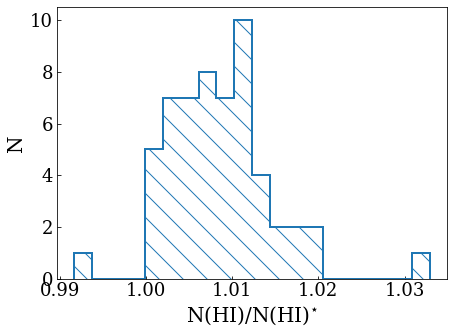

In [22]:
#plot the cold gas fraction

fig = plt.figure(figsize=(7.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])

ax = fig.add_subplot(1,1,1)
data1 = r
plt.hist(data1, bins=20, histtype='step', color='C0', hatch='\\', linewidth=2)
#plt.hist(data1, bins=np.arange(1,1.02,0.002), histtype='step', color='C0', hatch='\\', linewidth=2)
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel(r'N(HI)/N(HI)$^{\star}$', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')

plt.savefig('r_hist_5sig_{}.png'.format(field), bbox_inches='tight', dpi=200)

# Plot overlay Hydra

<SkyCoord (ICRS): (ra, dec) in deg
    (157.25, -27.59027778)>


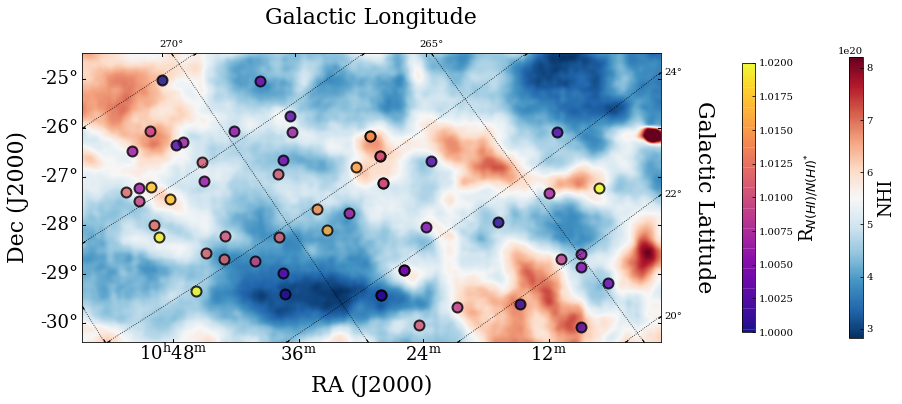

In [23]:
centre = '10:29:00, -27:35:25'
coordinate = centre.replace(',', '')
c = SkyCoord(coordinate, unit=(u.hourangle, u.deg))
print(c)
path_hi = SkyView.get_images(position=centre, width=12*u.deg, height=6*u.deg, survey=['HI4PI'], pixels=[1800,900])
hdulist_hi = path_hi[0]
d = hdulist_hi[0].data
h = hdulist_hi[0].header

#co_data = fits.open('/Users/denes/Research/high_lat_HI/Planck_CO/Rep_Lon264.69deg-Lat23.29deg_15deg_COM_CompMap_CO21-commander_2048_R2.00_v2.fits')  # Open the FITS file for reading
#print(co_data[1].shape)
#d2 = co_data[1].data
#h2 = co_data[1].header

#co_reprojected, footprint = reproject_interp(co_data[1], h)

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(111, projection=WCS(h))

# Display the moment map image
im = ax.imshow(d, cmap='RdBu_r', vmax=np.percentile(d,99.9))
#ax.contour(co_reprojected, levels=[0.4, 0.8], cmap='Reds', alpha=0.7)

x_lim = ax.get_xlim()
y_lim = ax.get_ylim()

for i in range(0, len(ra)):
    c = SkyCoord(ra[i], dec[i], unit=(u.hourangle, u.deg))
    im2 = ax.scatter(c.ra, c.dec, transform=ax.get_transform('fk5'), marker='o', s=100, linewidth=2, edgecolor='k', c=r[i], cmap='plasma', vmin=1, vmax=1.02, alpha=0.8)

#ax.set_title('Hydra', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=18)
ax.coords['ra'].set_axislabel('RA (J2000)', fontsize=22)
ax.coords['dec'].set_axislabel('Dec (J2000)', fontsize=22)
cbar_hi = plt.colorbar(im, orientation='vertical', fraction=0.018, pad=0.12)
cbar_hi.set_label('NHI', size=18)
cbar_hi2 = plt.colorbar(im2, orientation='vertical', fraction=0.02, pad=0.12)
cbar_hi2.set_label('R$_{N(HI)/N(HI)^{*}}$', size=18)

overlay = ax.get_coords_overlay('galactic')
overlay.grid(color='k', ls='dotted')
overlay[0].set_axislabel('Galactic Longitude', fontsize=22)
overlay[1].set_axislabel('Galactic Latitude', fontsize=22)

ax.set_xlim(x_lim)
ax.set_ylim(y_lim)


#plt.colorbar(im)
fig.savefig('Hydra_HI4PI_overlay_v2.png',dpi=200)

<SkyCoord (ICRS): (ra, dec) in deg
    (157.25, -27.59027778)>


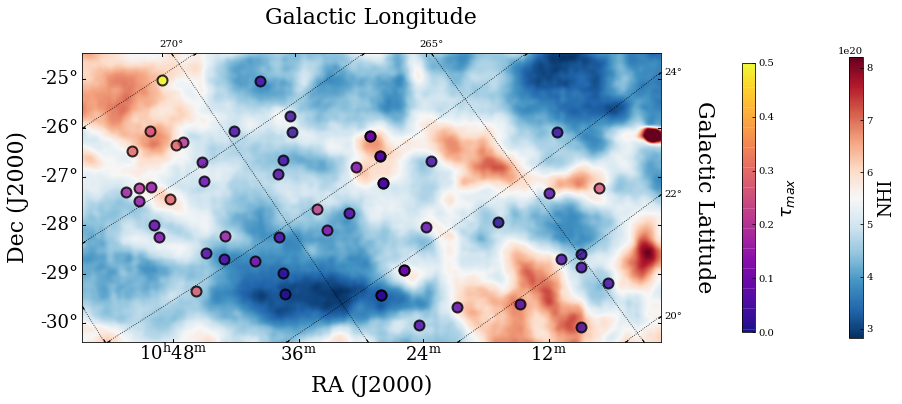

In [24]:
centre = '10:29:00, -27:35:25'
coordinate = centre.replace(',', '')
c = SkyCoord(coordinate, unit=(u.hourangle, u.deg))
print(c)
path_hi = SkyView.get_images(position=centre, width=12*u.deg, height=6*u.deg, survey=['HI4PI'], pixels=[1800,900])
hdulist_hi = path_hi[0]
d = hdulist_hi[0].data
h = hdulist_hi[0].header

#co_data = fits.open('/Users/denes/Research/high_lat_HI/Planck_CO/Rep_Lon264.69deg-Lat23.29deg_15deg_COM_CompMap_CO21-commander_2048_R2.00_v2.fits')  # Open the FITS file for reading
#print(co_data[1].shape)
#d2 = co_data[1].data
#h2 = co_data[1].header

#co_reprojected, footprint = reproject_interp(co_data[1], h)

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(111, projection=WCS(h))

# Display the moment map image
im = ax.imshow(d, cmap='RdBu_r', vmax=np.percentile(d,99.9))
#ax.contour(co_reprojected, levels=[0.4, 0.8], cmap='Reds', alpha=0.7)

x_lim = ax.get_xlim()
y_lim = ax.get_ylim()

for i in range(0, len(ra)):
    c = SkyCoord(ra[i], dec[i], unit=(u.hourangle, u.deg))
    im2 = ax.scatter(c.ra, c.dec, transform=ax.get_transform('fk5'), marker='o', s=100, linewidth=2, edgecolor='k', c=sources['tau_max'][i], cmap='plasma', vmin=0, vmax=0.5, alpha=0.8)

#ax.set_title('Hydra', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=18)
ax.coords['ra'].set_axislabel('RA (J2000)', fontsize=22)
ax.coords['dec'].set_axislabel('Dec (J2000)', fontsize=22)
cbar_hi = plt.colorbar(im, orientation='vertical', fraction=0.018, pad=0.12)
cbar_hi.set_label('NHI', size=18)
cbar_hi2 = plt.colorbar(im2, orientation='vertical', fraction=0.02, pad=0.12)
cbar_hi2.set_label(r'$\tau_{max}$', size=18)

overlay = ax.get_coords_overlay('galactic')
overlay.grid(color='k', ls='dotted')
overlay[0].set_axislabel('Galactic Longitude', fontsize=22)
overlay[1].set_axislabel('Galactic Latitude', fontsize=22)

ax.set_xlim(x_lim)
ax.set_ylim(y_lim)


#plt.colorbar(im)
fig.savefig('Hydra_HI4PI_overlay_tau_max.png',dpi=200)

# Plot overlay Norma

<SkyCoord (ICRS): (ra, dec) in deg
    (249.5, -59.83333333)>


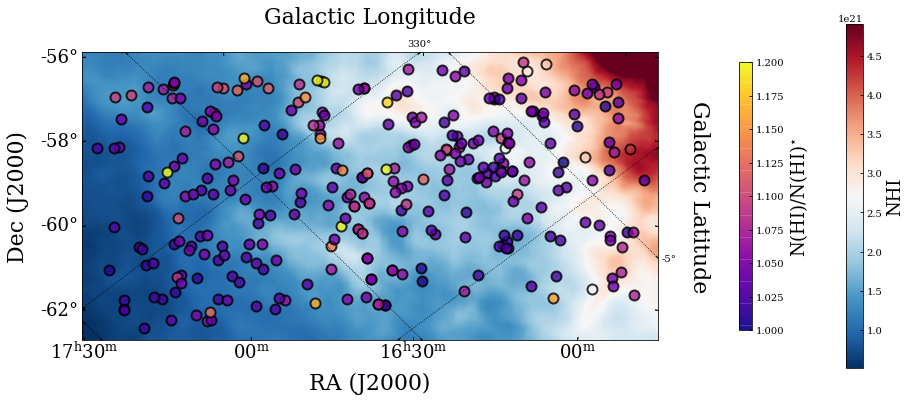

In [15]:
centre = '16:38:00, -59:50:00'
coordinate = centre.replace(',', '')
c = SkyCoord(coordinate, unit=(u.hourangle, u.deg))
print(c)
path_hi = SkyView.get_images(position=centre, width=12*u.deg, height=7*u.deg, survey=['HI4PI'], pixels=[1800,900])
hdulist_hi = path_hi[0]
d = hdulist_hi[0].data
h = hdulist_hi[0].header

#co_data = fits.open('/Users/denes/Research/high_lat_HI/Planck_CO/Rep_Lon327.39deg-Lat-7.76deg_15deg_COM_CompMap_CO21-commander_2048_R2.00.fits')  # Open the FITS file for reading
#d2 = co_data[1].data
#h2 = co_data[1].header

#co_reprojected, footprint = reproject_interp(co_data[1], h)

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(111, projection=WCS(h))

# Display the moment map image
im = ax.imshow(d, cmap='RdBu_r', vmax=np.percentile(d,99))
#ax.contour(co_reprojected, levels=[0.4, 0.8, 1.6], cmap='Reds', alpha=0.7)

x_lim = ax.get_xlim()
y_lim = ax.get_ylim()

for i in range(0, len(ra)):
    c = SkyCoord(ra[i], dec[i], unit=(u.hourangle, u.deg))
    im2 = ax.scatter(c.ra, c.dec, transform=ax.get_transform('fk5'), marker='o', s=100, linewidth=2, edgecolor='k', c=r[i], cmap='plasma', vmin=1, vmax=1.2, alpha=0.8)

#ax.set_title('Norma', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=18)
ax.coords['ra'].set_axislabel('RA (J2000)', fontsize=22)
ax.coords['dec'].set_axislabel('Dec (J2000)', fontsize=22)
cbar_hi = plt.colorbar(im, orientation='vertical', fraction=0.022, pad=0.12)
cbar_hi.set_label('NHI', size=18)
cbar_hi2 = plt.colorbar(im2, orientation='vertical', fraction=0.02, pad=0.12)
cbar_hi2.set_label(r'N(HI)/N(HI)$^{\star}$', size=18)

overlay = ax.get_coords_overlay('galactic')
overlay.grid(color='k', ls='dotted')
overlay[0].set_axislabel('Galactic Longitude', fontsize=22)
overlay[1].set_axislabel('Galactic Latitude', fontsize=22)

ax.set_xlim(x_lim)
ax.set_ylim(y_lim)


#plt.colorbar(im)
fig.savefig('Norma_HI4PI_overlay_cold_fraction.png',dpi=200)

<SkyCoord (ICRS): (ra, dec) in deg
    (249.5, -59.83333333)>


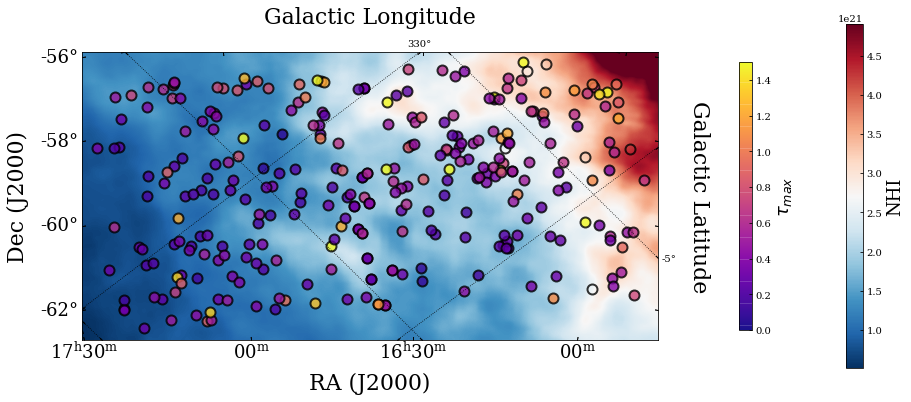

In [14]:
centre = '16:38:00, -59:50:00'
coordinate = centre.replace(',', '')
c = SkyCoord(coordinate, unit=(u.hourangle, u.deg))
print(c)
path_hi = SkyView.get_images(position=centre, width=12*u.deg, height=7*u.deg, survey=['HI4PI'], pixels=[1800,900])
hdulist_hi = path_hi[0]
d = hdulist_hi[0].data
h = hdulist_hi[0].header

#co_data = fits.open('/Users/denes/Research/high_lat_HI/Planck_CO/Rep_Lon327.39deg-Lat-7.76deg_15deg_COM_CompMap_CO21-commander_2048_R2.00.fits')  # Open the FITS file for reading
#d2 = co_data[1].data
#h2 = co_data[1].header

#co_reprojected, footprint = reproject_interp(co_data[1], h)

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(111, projection=WCS(h))

# Display the moment map image
im = ax.imshow(d, cmap='RdBu_r', vmax=np.percentile(d,99))
#ax.contour(co_reprojected, levels=[0.4, 0.8, 1.6], cmap='Reds', alpha=0.7)

x_lim = ax.get_xlim()
y_lim = ax.get_ylim()

for i in range(0, len(ra)):
    c = SkyCoord(ra[i], dec[i], unit=(u.hourangle, u.deg))
    im2 = ax.scatter(c.ra, c.dec, transform=ax.get_transform('fk5'), marker='o', s=100, linewidth=2, edgecolor='k', c=sources['tau_max'][i], cmap='plasma', vmin=0, vmax=1.5, alpha=0.8)

#ax.set_title('Norma', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=18)
ax.coords['ra'].set_axislabel('RA (J2000)', fontsize=22)
ax.coords['dec'].set_axislabel('Dec (J2000)', fontsize=22)
cbar_hi = plt.colorbar(im, orientation='vertical', fraction=0.022, pad=0.12)
cbar_hi.set_label('NHI', size=18)
cbar_hi2 = plt.colorbar(im2, orientation='vertical', fraction=0.02, pad=0.12)
cbar_hi2.set_label(r'$\tau_{max}$', size=18)

overlay = ax.get_coords_overlay('galactic')
overlay.grid(color='k', ls='dotted')
overlay[0].set_axislabel('Galactic Longitude', fontsize=22)
overlay[1].set_axislabel('Galactic Latitude', fontsize=22)

ax.set_xlim(x_lim)
ax.set_ylim(y_lim)


#plt.colorbar(im)
fig.savefig('Norma_HI4PI_overlay_tau_max.png',dpi=200)

In [13]:
c_ar = SkyCoord(ra, dec, unit=(u.hourangle, u.deg))

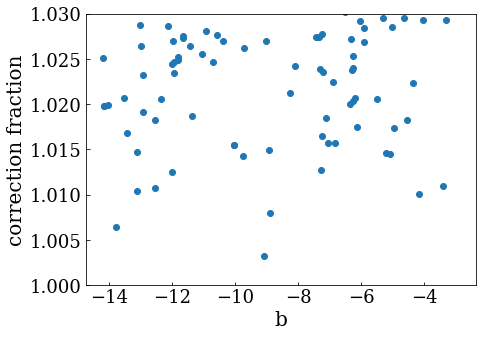

In [14]:
fig = plt.figure(figsize=(7.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])

ax = fig.add_subplot(1,1,1)

plt.plot(c_ar.galactic.b.deg, r, 'o')
plt.ylim(1,1.03)
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel('b', size=20,family='serif')
ax.set_ylabel('correction fraction', size=20,family='serif')

plt.savefig('correction_fraction_b_{}.png'.format(field), bbox_inches='tight', dpi=200)



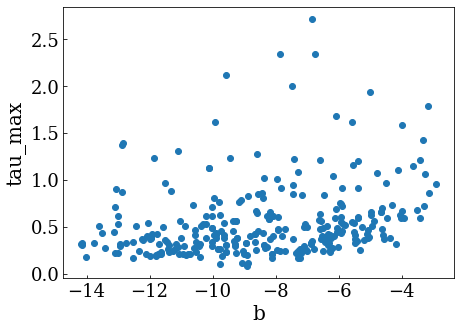

In [15]:

fig = plt.figure(figsize=(7.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])

ax = fig.add_subplot(1,1,1)

plt.plot(c_ar.galactic.b.deg, sources['tau_max'], 'o')

#plt.ylim(1,1.2)
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
ax.set_xlabel('b', size=20,family='serif')
ax.set_ylabel('tau_max', size=20,family='serif')

plt.savefig('tau_max_b_{}.png'.format(field), bbox_inches='tight', dpi=200)

#plt.ylim(0,1.5)

/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


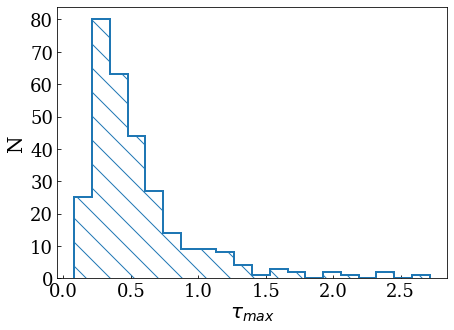

In [12]:
#plot the cold gas fraction

fig = plt.figure(figsize=(7.,5.))
plt.axes(frameon=False)
plt.xticks([])
plt.yticks([])

ax = fig.add_subplot(1,1,1)
data1 =  sources['tau_max']
plt.hist(data1, bins=20, histtype='step', color='C0', hatch='\\', linewidth=2)
#plt.hist(data1, bins=np.arange(1,1.02,0.002), histtype='step', color='C0', hatch='\\', linewidth=2)
plt.xticks(family='serif',size=18)
plt.yticks(family='serif',size=18)
#ax.set_ybound(0, 20)
ax.set_xlabel(r'$\tau_{max}$', size=20,family='serif')
ax.set_ylabel('N', size=20,family='serif')

plt.savefig('tau_max_hist_5sig_{}.png'.format(field), bbox_inches='tight', dpi=200)